In [ ]:
#@title Imports
import numpy as np
import tempfile
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from google3.learning.deepmind.xdata import xdata

from google3.learning.deepmind.xmanager import parameters
from google3.learning.deepmind.xmanager2.client import convert
from google3.learning.deepmind.xmanager2.client import xmanager_api

xm_client = xmanager_api.XManagerApi()
%config InlineBackend.figure_format='retina'

g3_root = "/google_src/head/depot/google3"
local_font_dir = tempfile.mkdtemp(prefix="colab_fonts")

def define_google_font(font_file_path: str):
  font_file_name = os.path.basename(font_file_path)
  remote_font_path = os.path.join(g3_root, font_file_path)
  local_font_path = os.path.join(local_font_dir, font_file_name)
  gfile.Copy(remote_font_path, local_font_path, overwrite=True)
  font_list = matplotlib.font_manager.createFontList([local_font_path])
  matplotlib.font_manager.fontManager.ttflist.extend(font_list)

define_google_font("third_party/googlefonts/api/apache/robotocondensed/RobotoCondensed-Regular.ttf")

from colabtools import drive
def save_plot_to_drive(name):
  plt.savefig('tmp.pdf')
  file_id = drive.SaveFile(f'{name}.pdf', open('tmp.pdf', 'rb').read(), mime_type='application/pdf')
  return f'https://drive.google.com/file/d/{file_id}/view'

In [ ]:
#@title Input Output Functions
EXPERIMENT_ID_COLUMN = 'XId'
WORK_UNIT_ID_COLUMN = 'WId'
RUN_ID_COLUMN = 'RId'
TICK_COLUMN = 'tick'
TASK_NAME = 'task'
KL_EPSILON_MEAN = 'kl_epsilon_mean'
PENALTY_KL_EPSILON_SAMPLES = 'penalty_kl'
UPRIGHT_BOUNDS = 'upright'
STAND_HEIGHT_BOUNDS = 'stand_bounds'

def _rename_columns(df, inplace=False):
  old2new = {
      'XManager/experiment_id': EXPERIMENT_ID_COLUMN,
      'XManager/work_unit_id': WORK_UNIT_ID_COLUMN,
      'XManager/run_id': RUN_ID_COLUMN,
      'XManager/tick': TICK_COLUMN,
      'config.environment.environment.kwargs.task_name': TASK_NAME,
      'config.environment.upright_bounds': UPRIGHT_BOUNDS,
      'config.environment.stand_height_bounds': STAND_HEIGHT_BOUNDS,
      'config.kl_epsilon_mean': KL_EPSILON_MEAN,
      'config.penalty_kl_epsilon_samples': PENALTY_KL_EPSILON_SAMPLES
  }
  return df.rename(columns=old2new, inplace=inplace)

def load_data(experiment_id, dataframe_name):
  experiment = xm_client.get_experiment(experiment_xid)
  experiment_df = convert.to_dataframes(experiment)
  data_id = xdata.get_experiment_data_id(experiment_xid)
  df = xdata.bt.reader(data_id, dataframe_name).read_dataframe()
  df = _rename_columns(df)
  return df

def read_hyper(experiment_id):
  hyper = parameters.get_experiment_parameters(experiment_xid)
  hyper.insert(0, EXPERIMENT_ID_COLUMN, experiment_xid)
  hyper = _rename_columns(hyper)
  return hyper

def merge_data_with_hyper(data, hyper):
  return pd.merge(data, hyper, how='left',
                  on=[EXPERIMENT_ID_COLUMN, WORK_UNIT_ID_COLUMN])

In [ ]:
sns.set(context='talk',style='white', font_scale=1.2)
plt.style.available
plt.style.use("dark_background")
plt.rcParams["figure.dpi"] = 300.
matplotlib.rcParams["font.family"] = "Roboto Condensed"

#@title Plt settings
def set_plt_black(font_size=40):  
  plt.style.use("dark_background")
  matplotlib.rcParams["font.family"] = "Roboto Condensed"
  matplotlib.rcParams["font.size"] = font_size

def set_plt_white(font_size=40):  
  plt.style.use("classic")
  matplotlib.rcParams["font.family"] = "Roboto Condensed"
  matplotlib.rcParams["font.size"] = font_size

# XId: 12065620: 20200323 mpo imp sweeping the suite

In [ ]:
#@title Load dataframes
experiment_xid = 12065620
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

df_name_evaluator_bc = 'evaluator_bc'
df_evaluator_bc = load_data(experiment_xid, df_name_evaluator_bc)
df_evaluator_bc = merge_data_with_hyper(df_evaluator_bc,hyper)

concatenated = pd.concat([df_evaluator.assign(dataset='evaluator'), df_evaluator_bc.assign(dataset='evaluator_bc')])

(0, 1000)

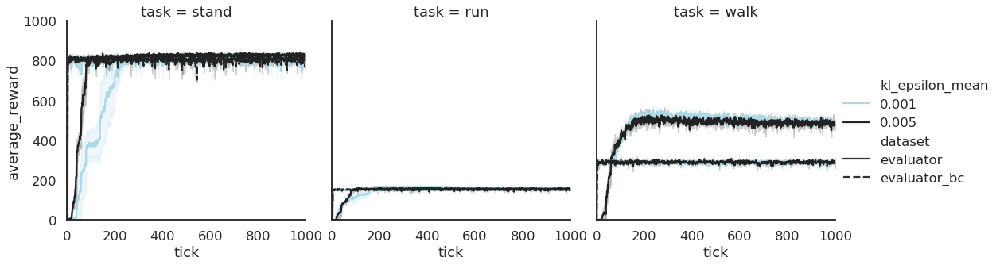

In [ ]:
#@title Plot
sns.relplot(x="tick", y="average_reward", data=concatenated.iloc[::1, :], 
            col=TASK_NAME, hue="kl_epsilon_mean", style="dataset", kind="line",
            legend="full", palette=sns.dark_palette("lightblue", reverse=True, n_colors=2))

plt.ylim(0, 1000)
plt.xlim(0, 1000)

# XId: 12093736: 20200324_mpo_imp_sweep


In [ ]:
#@title Load dataframes
experiment_xid = 12093736
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

df_name_evaluator_bc = 'evaluator_bc'
df_evaluator_bc = load_data(experiment_xid, df_name_evaluator_bc)
df_evaluator_bc = merge_data_with_hyper(df_evaluator_bc,hyper)

concatenated = pd.concat([df_evaluator.assign(dataset='evaluator'), df_evaluator_bc.assign(dataset='evaluator_bc')])

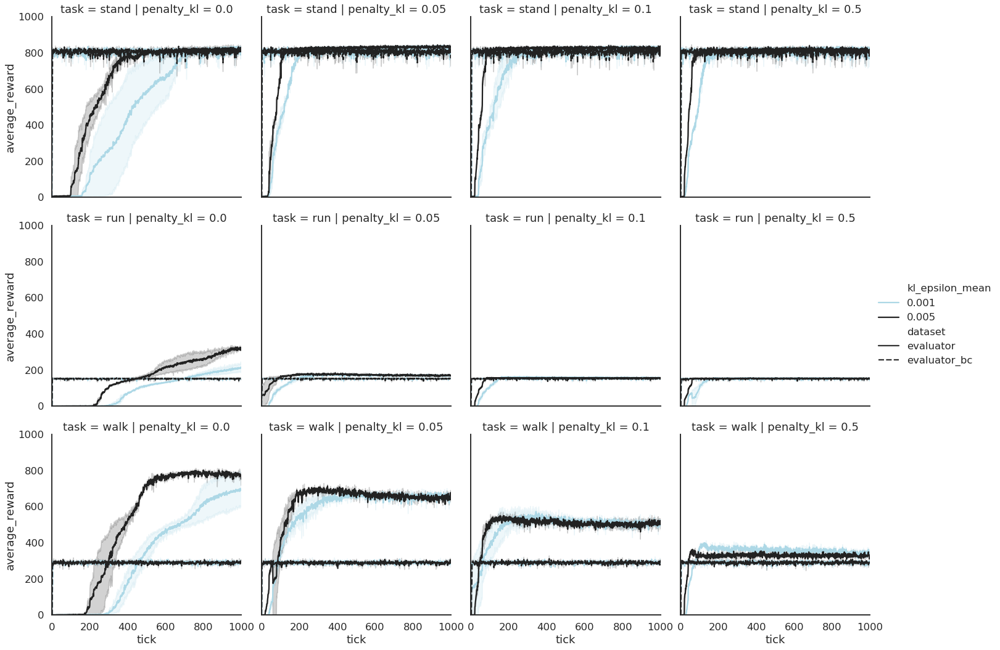

In [ ]:
#@title Plot
g = sns.relplot(x="tick", y="average_reward", data=concatenated.iloc[::1, :], 
            row=TASK_NAME, col='penalty_kl', 
            hue="kl_epsilon_mean", style="dataset", kind="line", 
            legend="full", palette=sns.dark_palette("lightblue", reverse=True, n_colors=2))

g.set(xlim=(0, 1000), ylim=(0, 1000))

# 12139476: 20200326_mo-mpo_sweep_reward-sparsity

In [ ]:
#@title Load dataframes
experiment_xid = 12139476
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

df_evaluator = df_evaluator[df_evaluator['kl_epsilon_mean'] == 0.005]
df_evaluator_stand = df_evaluator[df_evaluator['task'] == 'stand']
df_evaluator_walk = df_evaluator[df_evaluator['task'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['task'] == 'run']

/export/hda3/borglet/remote_hdd_fs_dirs/0.colab_kernel_deepmind_gpu_py3_shrutimishra.kernel.shrutimishra.517187966301.14b334fb3717c109/mount/server/dm_notebook3.par/google3/learning/deepmind/python/storage/util.py:164: UserWarning: Flattening read results. You will get quicker throughput if you pass flatten_dict=True to the Read method itself.


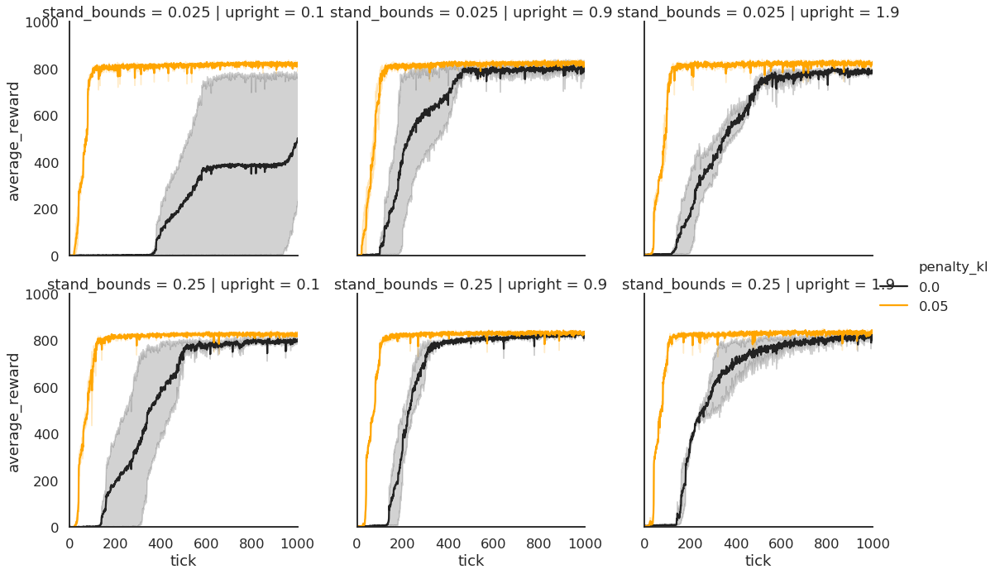

In [ ]:
#@title Plot stand task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_stand.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=2),
                )

g.set(xlim=(0, 1000), ylim=(0, 1000))

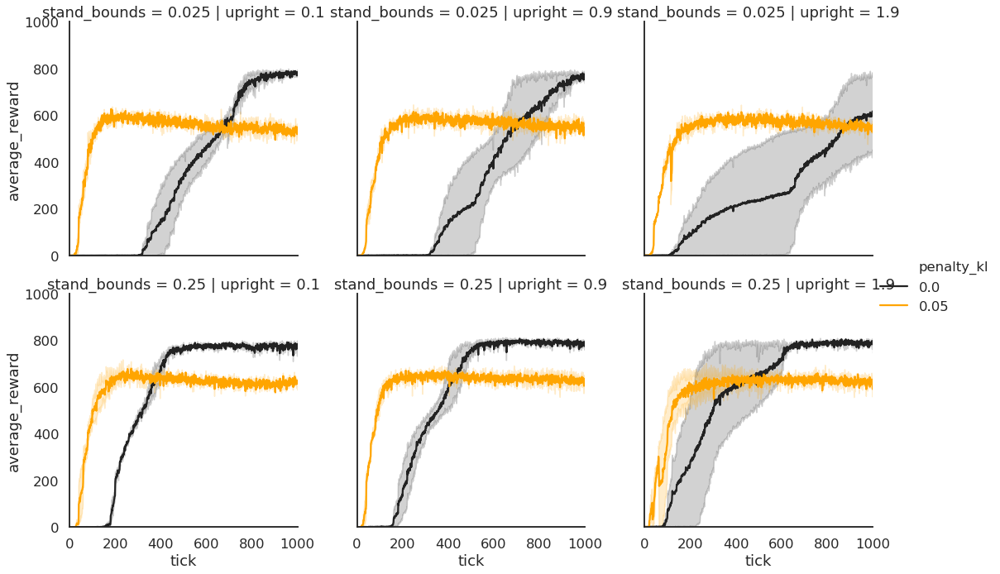

In [ ]:
#@title Plot walk task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_walk.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=2),
                )

g.set(xlim=(0, 1000), ylim=(0, 1000))

In [ ]:
df_evaluator_walk = df_evaluator_walk[df_evaluator_walk['stand_bounds'] == 0.025]
df_evaluator_walk = df_evaluator_walk[df_evaluator_walk['upright'] == 0.1]

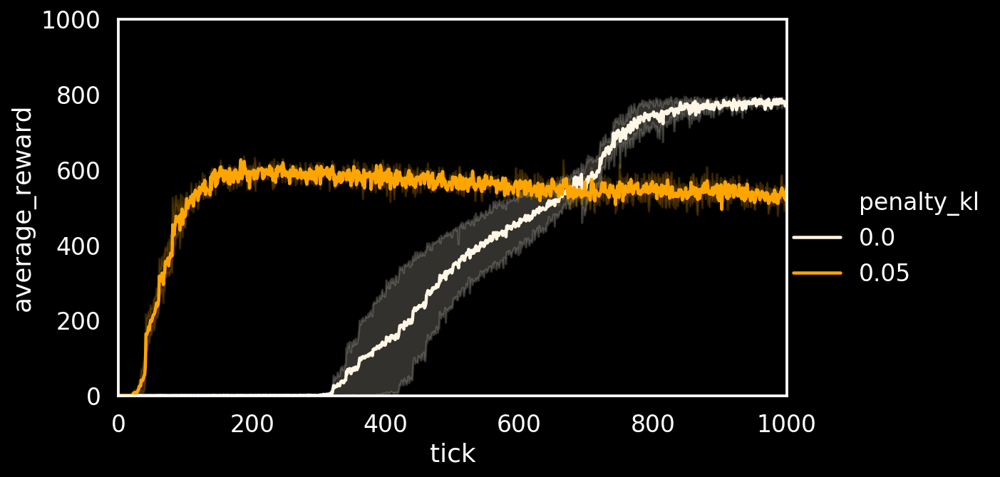

In [ ]:
#@title Plot walk task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_walk.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                kind="line", 
                legend="full", palette=sns.light_palette("orange", n_colors=2),
                aspect=1.618
                )
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
g.set(xlim=(0, 1000), ylim=(0, 1000))
plt.show()

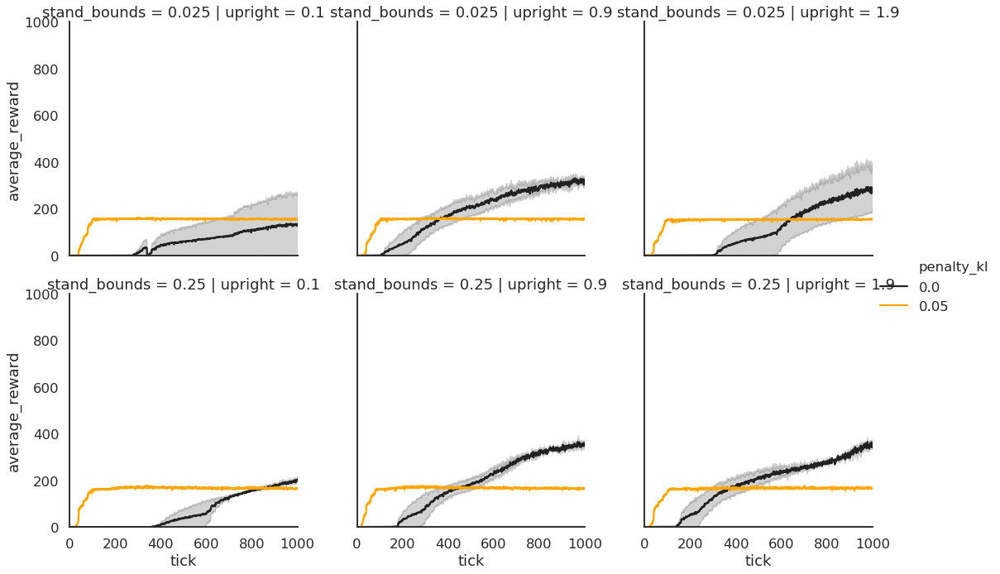

In [ ]:
#@title Plot run task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_run.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=2),
                )

g.set(xlim=(0, 1000), ylim=(0, 1000))

# 12556278: 20200410_mo-mpo_sweep_kl-penalty_reward-sparsity

In [ ]:
#@title Load dataframes
experiment_xid = 12556278
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

df_evaluator_stand = df_evaluator[df_evaluator['task'] == 'stand']
df_evaluator_walk = df_evaluator[df_evaluator['task'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['task'] == 'run']

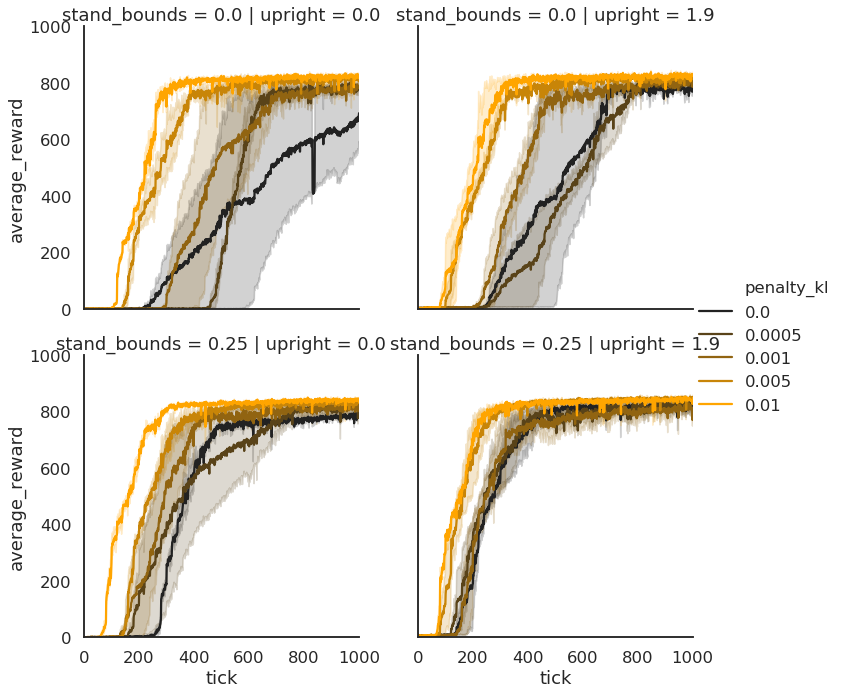

In [ ]:
#@title Plot stand task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_stand.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 1000), ylim=(0, 1000))

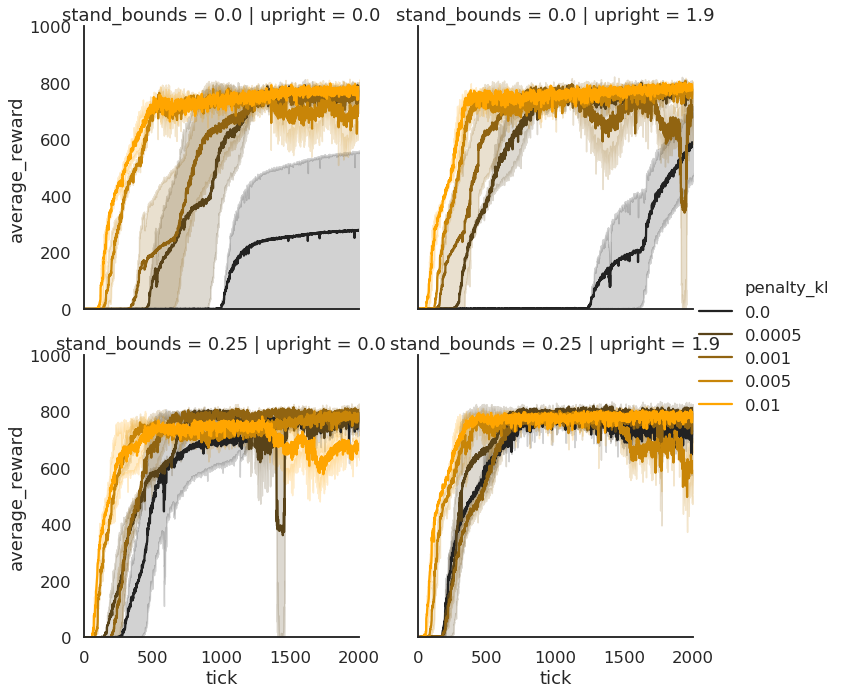

In [ ]:
#@title Plot walk task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_walk.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 2000), ylim=(0, 1000))

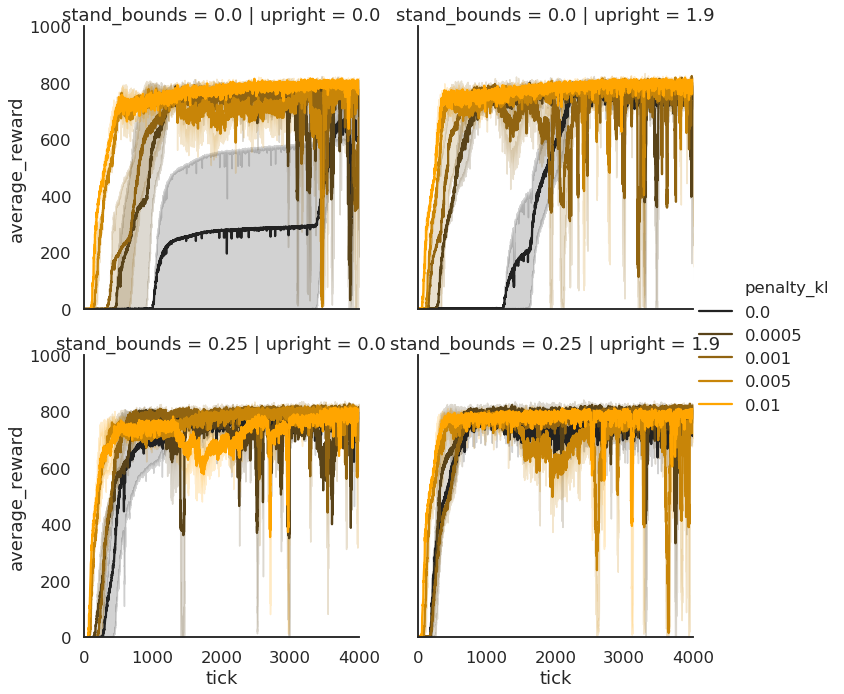

In [ ]:
#@title Plot walk task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_walk.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 4000), ylim=(0, 1000))

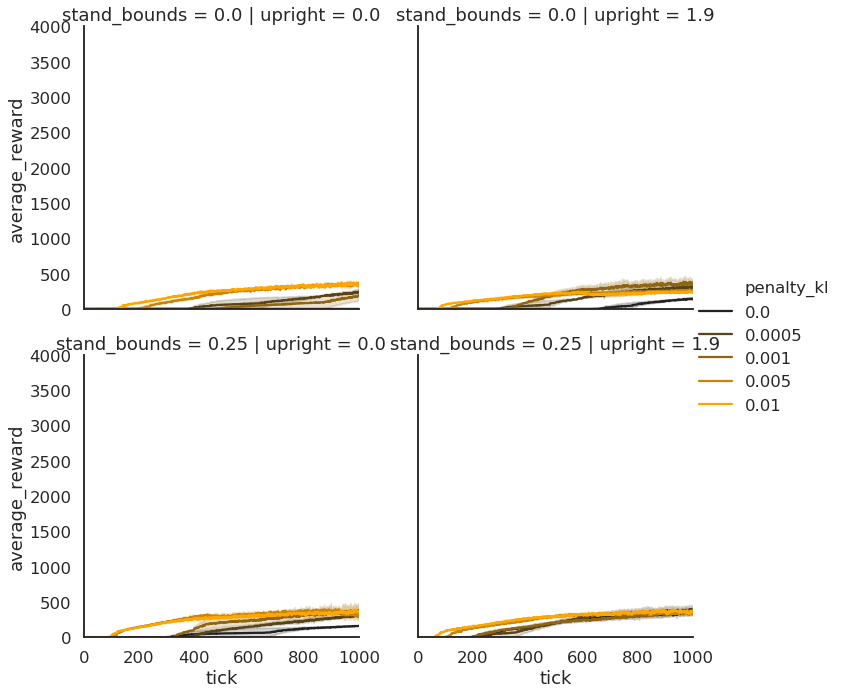

In [ ]:
#@title Plot run task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_run.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 4000), ylim=(0, 1000))

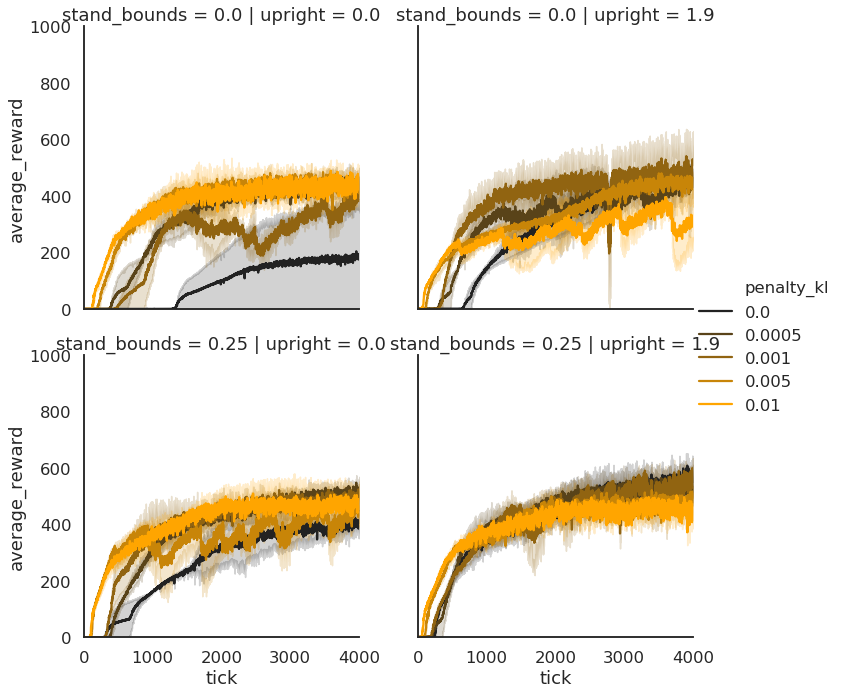

In [ ]:
#@title Plot run task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_run.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 4000), ylim=(0, 1000))

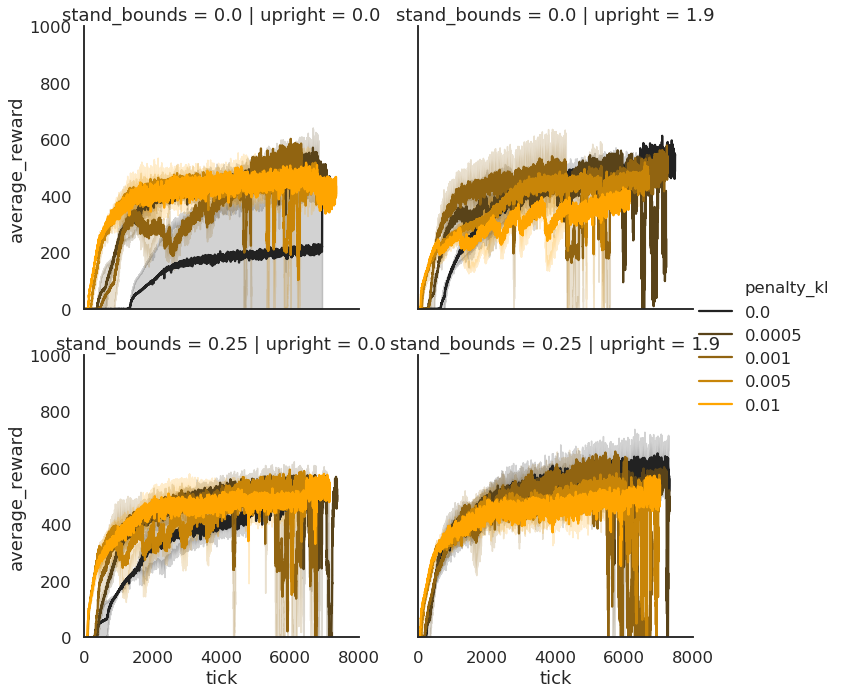

In [ ]:
#@title Plot run task
g = sns.relplot(x="tick", y="average_reward", data=df_evaluator_run.iloc[::1, :],
                hue=PENALTY_KL_EPSILON_SAMPLES, 
                row=STAND_HEIGHT_BOUNDS, col=UPRIGHT_BOUNDS,
                kind="line", 
                legend="full", palette=sns.dark_palette("orange", n_colors=5),
                )

g.set(xlim=(0, 8000), ylim=(0, 1000))

# Re run humanoid tasks for plots
> XId: 14717261

> This is to generate the plots above from the same codebase (l/d/r/acme_v2)

> cl/318450816

In [ ]:
#@title Load dataframes
experiment_xid = 14717261
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'mpo.teacher1_penalization',
                                  'mpo.teacher2_penalization',
                                  'agent.samples_per_insert'], axis=1)

df_evaluator = df_evaluator.rename(columns={"episode_return": 'episode return',
                                            "mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher', 
                                            "mpo.epsilon": r'$\epsilon$',
                                            "environment.task_name": 'task',
                                            'environment.upright_margin': 'upright margin',
                                            'environment.stand_margin': 'stand margin'})


In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 100
print('*' * 50)
print("I am using {} equally space bins".format(n_bins))
print('Perhaps logarithmically spaced bins, etc, would work better.')
print('*' * 50)
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 12752000.0
**************************************************
I am using 100 equally space bins
Perhaps logarithmically spaced bins, etc, would work better.
**************************************************


In [ ]:
df_evaluator_stand = df_evaluator[df_evaluator['task'] == 'stand']
df_evaluator_walk = df_evaluator[df_evaluator['task'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['task'] == 'run']

'https://drive.google.com/file/d/1BTYUIvYEKfJJwC3RzmS2EF9W45Mk2iIo/view'

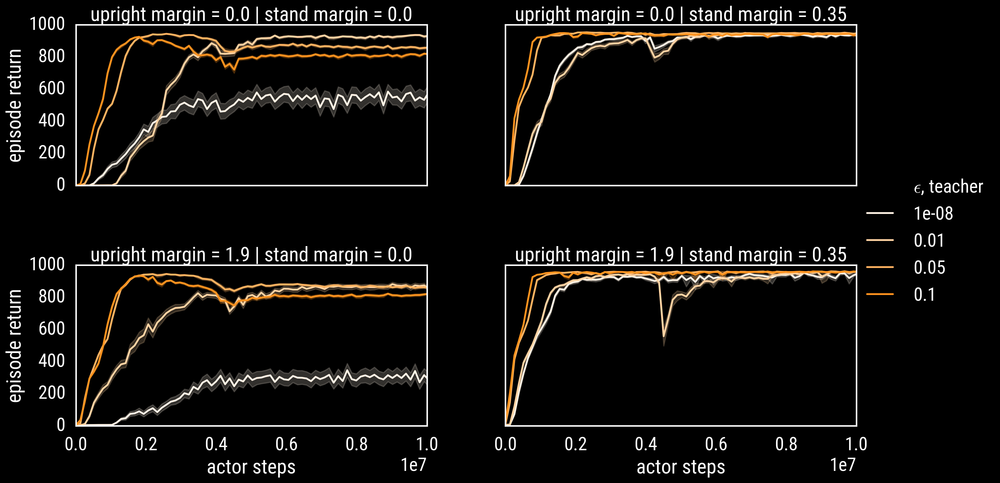

In [ ]:
sns.set(context='talk',style='white', font_scale=1.4)
set_plt_black(font_size=60)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_stand, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.light_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_stand_14717261')

'https://drive.google.com/file/d/1-4y7FKyEe-hiGm1OdZc8EgdrSb_R6psL/view'

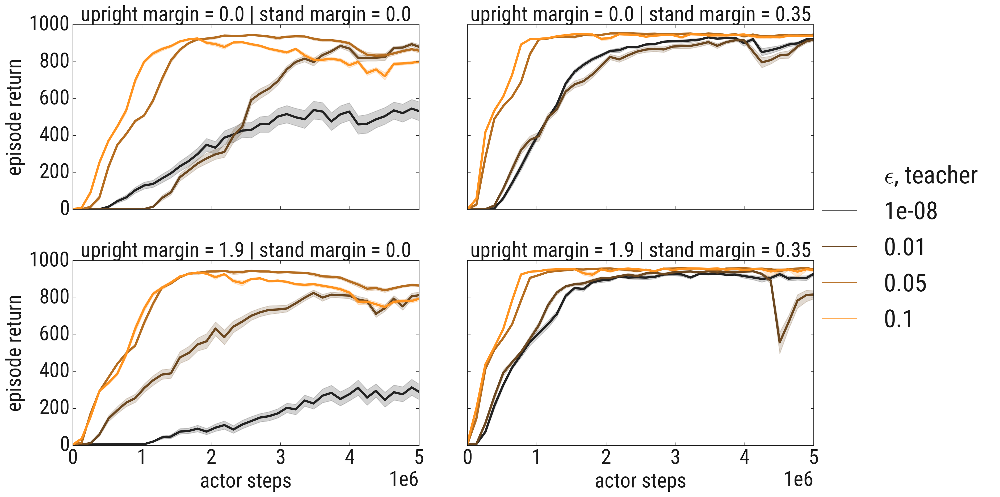

In [ ]:
sns.set(context='talk',style='white', font_scale=1.0)
set_plt_white(font_size=28)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_stand, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.dark_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618,
            linewidth=3)
plt.ylim(0, 1000)
plt.xlim(0, 5e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_stand_14717261_white')

'https://drive.google.com/file/d/1sIWZDDHNxuK0FhmARILMUTYA3A7RtBMi/view'

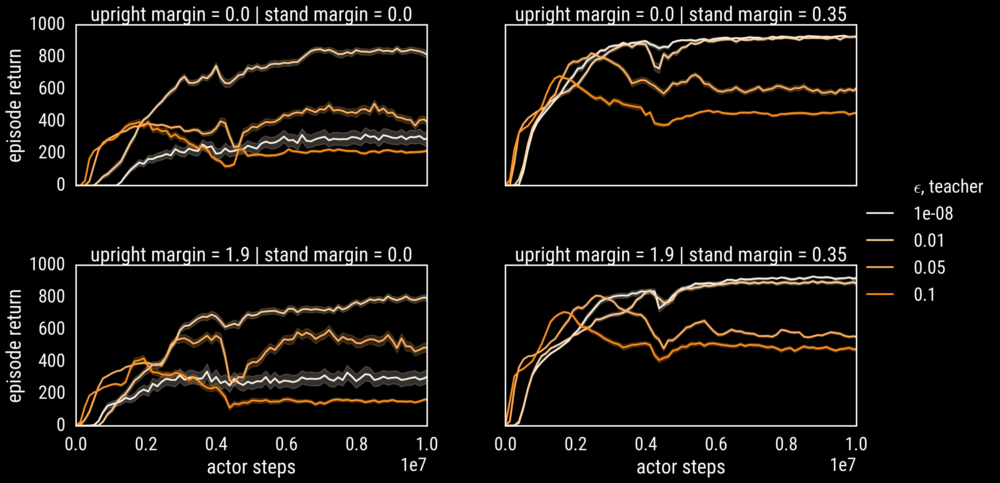

In [ ]:
sns.set(context='talk',style='white', font_scale=1.4)
set_plt_black(font_size=60)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_walk, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.light_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_walk_14717261')

'https://drive.google.com/file/d/1sWBO3OYSFqZwttjBh3bKHO7e6axcP5m9/view'

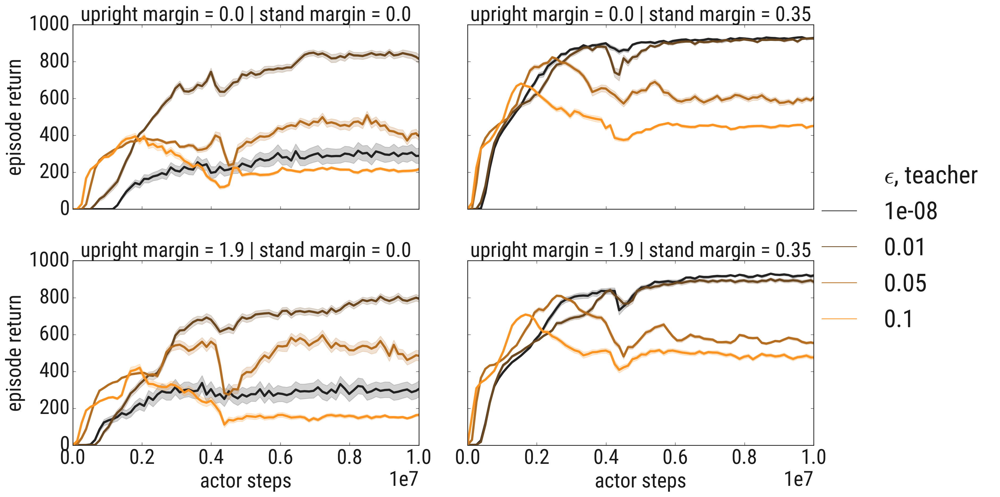

In [ ]:
sns.set(context='talk',style='white', font_scale=1.0)
set_plt_white(font_size=28)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_walk, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.dark_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618,
            linewidth=3)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_walk_14717261_white')

'https://drive.google.com/file/d/1J-MWvDaNX1kvoofp6S7FdctHR5PRpffK/view'

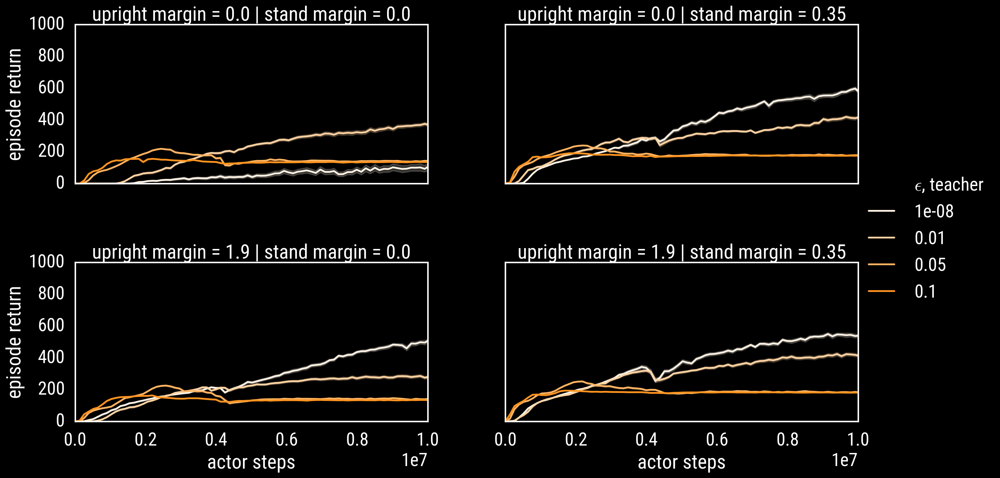

In [ ]:
sns.set(context='talk',style='white', font_scale=1.4)
set_plt_black(font_size=60)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_run, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.light_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_run_14717261')

Beginning OAuth2 authorization process ...
Authentication successful.


'https://drive.google.com/file/d/1-9wHFiiaNovkhoas5wN15FrjKqk3QYuK/view'

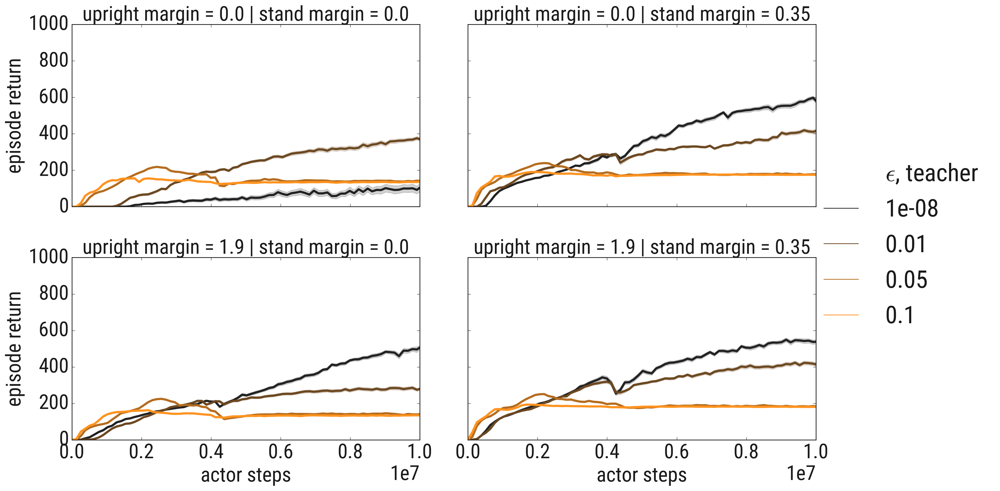

In [ ]:
sns.set(context='talk',style='white', font_scale=1.0)
set_plt_white(font_size=28)
plt.rcParams["figure.figsize"] = [30,15]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator_run, 
            kind="line",
            row='upright margin',
            col='stand margin',
            hue=r'$\epsilon$, teacher', 
            legend="full", 
            palette=sns.dark_palette((255/255, 147/255, 31/255), n_colors=4),
            aspect=1.618,
            linewidth=3)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_run_14717261_white')

# 13604965: Task = teacher2 Task
Walk when initialised in standing orientation

In [ ]:
#@title Load dataframes
experiment_xid = 13604965
14703143
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'timestamp',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

df_evaluator = df_evaluator.rename(columns={"mpo.teacher2_epsilon_penalty": "teacher2_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 500
print('*' * 50)
print("I am using {} equally space bins".format(n_bins))
print('Perhaps logarithmically spaced bins, etc, would work better.')
print('*' * 50)
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

9.0 119846106.0
**************************************************
I am using 500 equally space bins
Perhaps logarithmically spaced bins, etc, would work better.
**************************************************


In [ ]:
df_evaluator_128 = df_evaluator[df_evaluator['agent.samples_per_insert'] == 128]

(0, 1000)

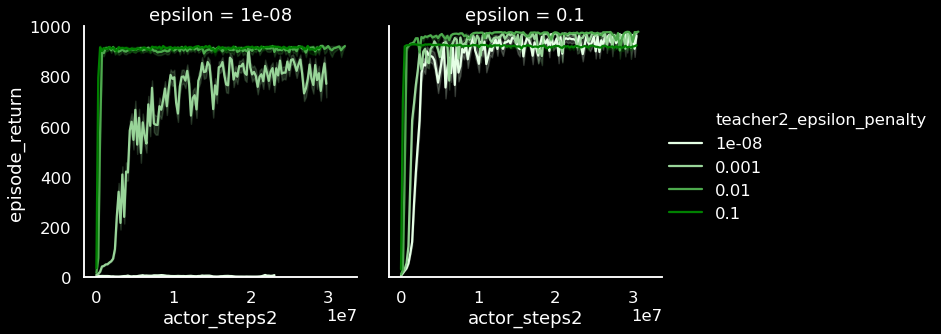

In [ ]:
#@title Plot
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_128.iloc[::1, :], 
            col="epsilon", hue="teacher2_epsilon_penalty", kind="line",
            legend="full", palette=sns.light_palette("green", n_colors=4))

plt.ylim(0, 1000)

# 13685214: Teacher1 + Teacher2 on Humanoid tasks

In [ ]:
#@title Load dataframes
experiment_xid = 13685214
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_evaluator_0_1 = df_evaluator[df_evaluator['mpo.epsilon'] == 0.1]
df_evaluator = df_evaluator_0_1[df_evaluator_0_1['agent.samples_per_insert'] == 128]

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher1_epsilon_penalty", 
                                            "mpo.teacher2_epsilon_penalty": "teacher2_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 500
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

1000.0 66852000.0


In [ ]:
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

In [ ]:
df_evaluator_walk = df_evaluator[df_evaluator['environment.task_name'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['environment.task_name'] == 'run']

(0, 100000000.0)

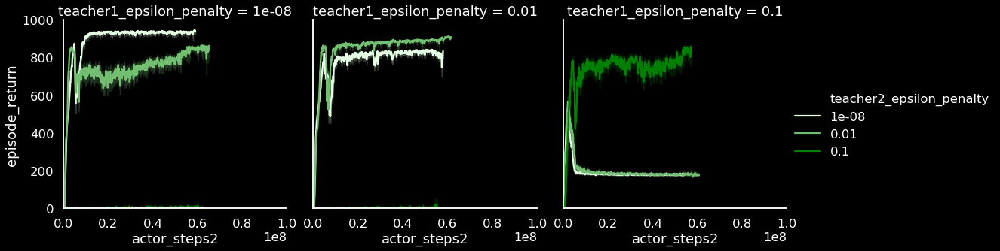

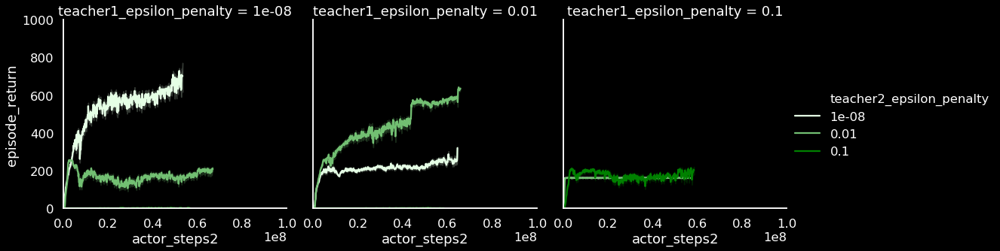

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=3))
plt.ylim(0, 1000)
plt.xlim(0, 1e8)
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=3))
plt.ylim(0, 1000)
plt.xlim(0, 1e8)

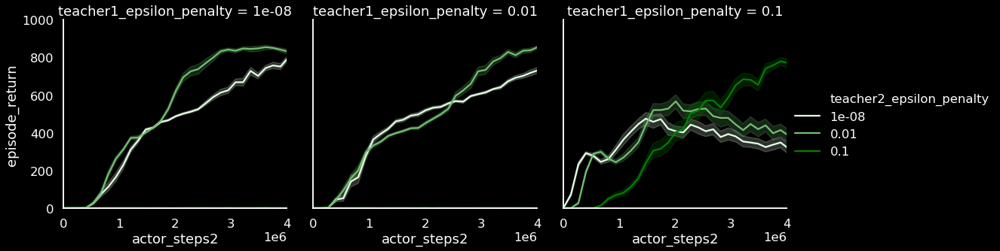

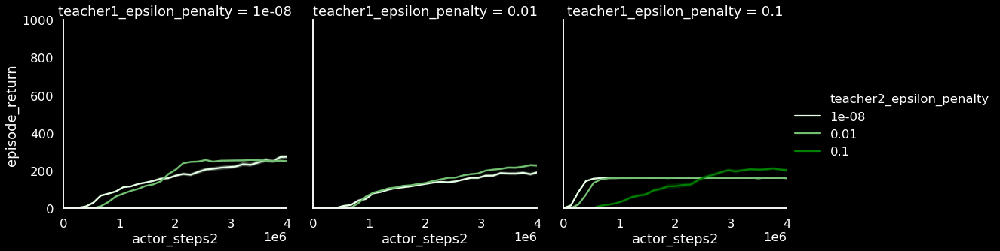

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=3))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=3))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

# 13685214 Humanoid tasks with teacher switched off after threshold no. of learner steps

In [ ]:
#@title Load dataframes
experiment_xid = 13727467
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

# Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher1_epsilon_penalty", 
                                            "mpo.epsilon_count_threshold": "epsilon_count_threshold"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 500
print('*' * 50)
print("I am using {} equally space bins".format(n_bins))
print('Perhaps logarithmically spaced bins, etc, would work better.')
print('*' * 50)
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

1000.0 25852000.0
**************************************************
I am using 500 equally space bins
Perhaps logarithmically spaced bins, etc, would work better.
**************************************************


In [ ]:
df_evaluator_walk = df_evaluator[df_evaluator['environment.task_name'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['environment.task_name'] == 'run']

(0, 10000000.0)

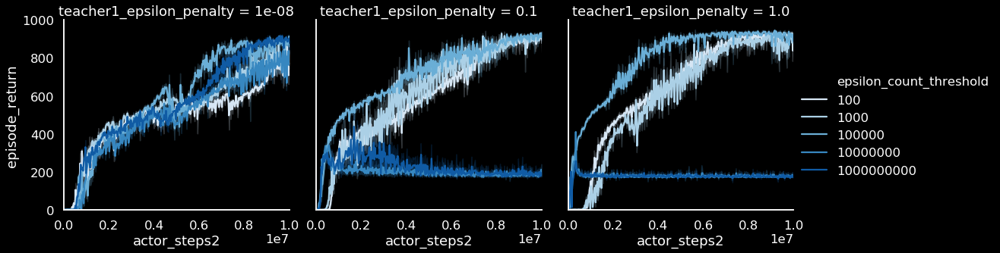

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty", hue="epsilon_count_threshold", kind="line",
            legend="full", palette=sns.color_palette("Blues", n_colors=5))

plt.ylim(0, 1000)
plt.xlim(0, 1e7)

(1, 10000000.0)

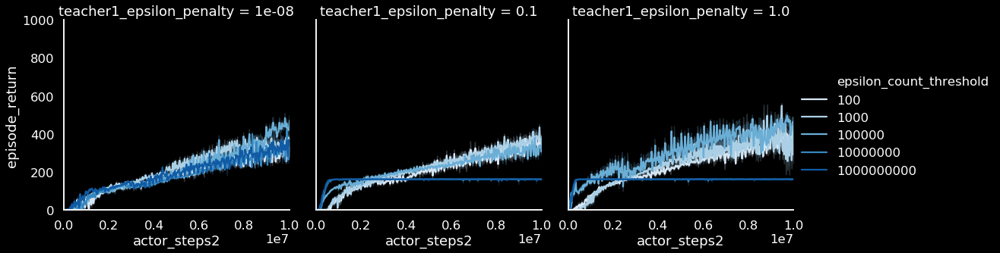

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty", hue="epsilon_count_threshold", kind="line",
            legend="full", palette=sns.color_palette("Blues", n_colors=5))

plt.ylim(0, 1000)
plt.xlim(1, 1e7)

# Teacher 1 + nicer Teacher 2 on Humanoid Tasks


In [ ]:
#@title Load dataframes
experiment_xid = 13870357
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_evaluator = df_evaluator[df_evaluator['agent.samples_per_insert'] == 128]

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher1_epsilon_penalty", 
                                            "mpo.teacher2_epsilon_penalty": "teacher2_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 750
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

1000.0 62397000.0


In [ ]:
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]

In [ ]:
df_evaluator['actor_steps2'] = actor_steps2

In [ ]:
df_evaluator_walk = df_evaluator[df_evaluator['environment.task_name'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['environment.task_name'] == 'run']

(0, 100000000.0)

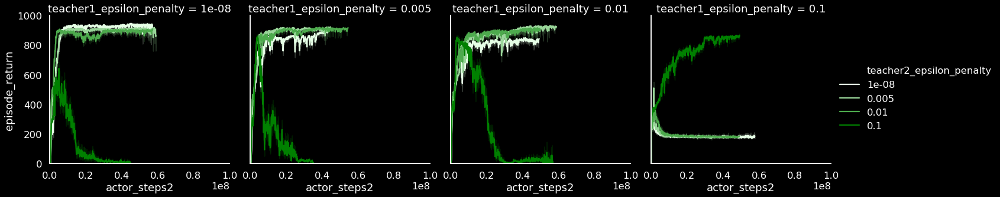

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 1e8)

(0, 100000000.0)

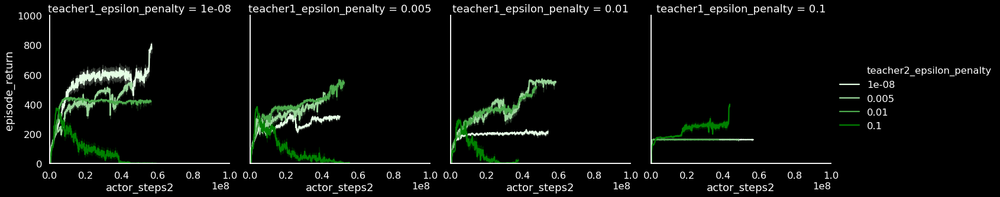

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 1e8)

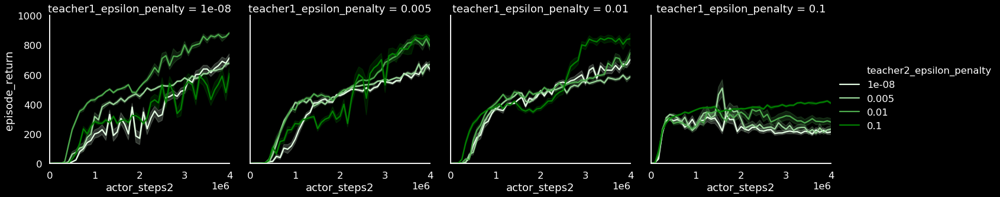

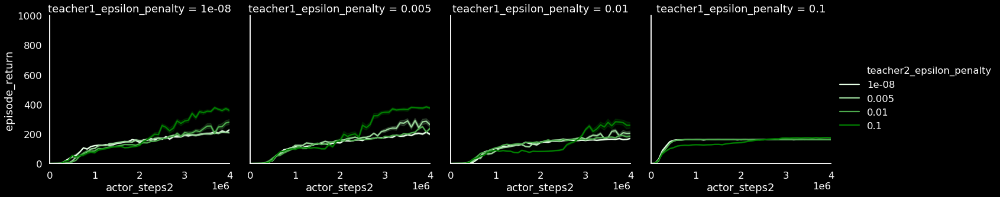

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            #style="mpo.teacher1_epsilon_penalty",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

## XId [13902261](https://flatboard.corp.google.com/plot/5ecdf7d2-0000-2134-a281-001a1143f964) -- larger samples_per_insert

In [ ]:
#@title Load dataframes
experiment_xid = 13902261
samples_per_insert = 256
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_evaluator = df_evaluator[df_evaluator['agent.samples_per_insert'] == samples_per_insert]

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher1_epsilon_penalty", 
                                            "mpo.teacher2_epsilon_penalty": "teacher2_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 750
steps = np.linspace(min_actor_step, max_actor_step, n_bins)

1000.0 30246000.0


In [ ]:
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]

In [ ]:
df_evaluator['actor_steps2'] = actor_steps2

In [ ]:
df_evaluator_walk = df_evaluator[df_evaluator['environment.task_name'] == 'walk']
df_evaluator_run = df_evaluator[df_evaluator['environment.task_name'] == 'run']

(0, 1000)

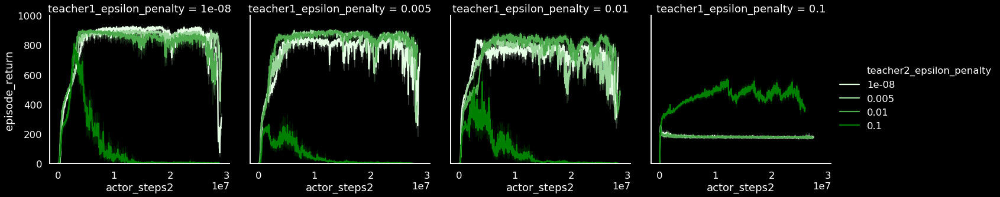

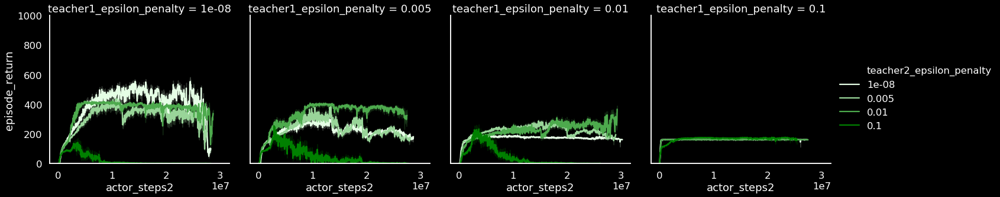

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)

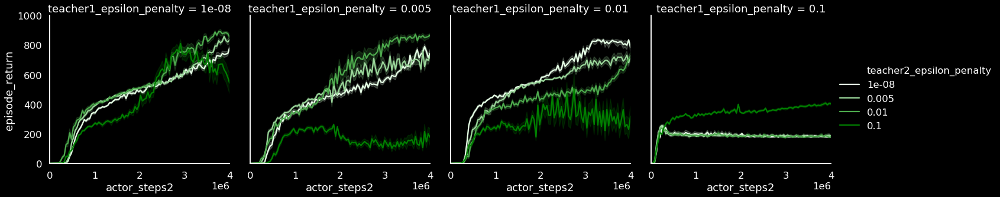

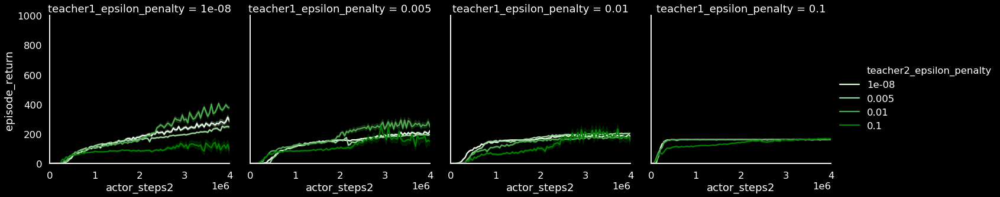

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

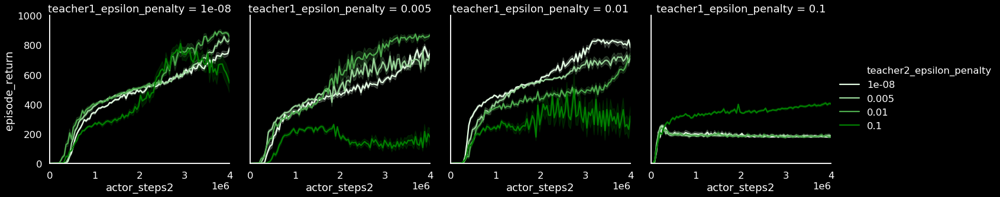

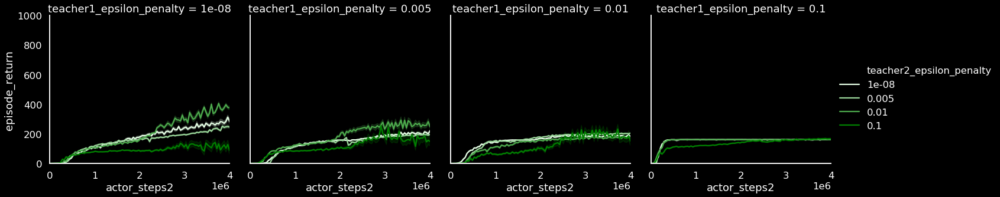

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_walk.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator_run.iloc[::1, :], 
            col="teacher1_epsilon_penalty",
            hue="teacher2_epsilon_penalty", kind="line",
            legend="full", 
            palette=sns.light_palette("green", n_colors=4))
plt.ylim(0, 1000)
plt.xlim(0, 4e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

# Teacher 1 + Teacher 2 
> rerun from acme_v2_20200626

In [115]:
#@title Load dataframes
experiment_xid = 14823367
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher 1', 
                                            "mpo.teacher2_epsilon_penalty": r'$\epsilon$, teacher 2', 
                                            "mpo.epsilon": "epsilon",
                                            "episode_return": 'episode return',
                                            "environment.walk_margin": 'walk margin'})

In [116]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 100
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

9000 5652000


In [ ]:
df_evaluator.head()

,WId,actor_episodes,actor_steps,episode_return,evaluator_episodes,evaluator_steps,environment.stand_margin,seed,"$\epsilon$, teacher 2",environment.upright_margin,mpo.teacher1_penalization,environment.task_name,"$\epsilon$, teacher 1",agent.samples_per_insert,epsilon,mpo.teacher2_penalization,environment.walk_margin,actor steps
0,1,16,16000,0.766463,1,1000,0.35,0,0.01,1.9,True,walk,0.01,128,0.1,True,0.0,15128.170895
1,1,16,16000,1.475632,4,4000,0.35,0,0.01,1.9,True,walk,0.01,128,0.1,True,0.0,15128.170895
2,1,17,17000,1.582839,9,9000,0.35,0,0.01,1.9,True,walk,0.01,128,0.1,True,0.0,18192.256342
3,1,17,17000,0.948764,14,14000,0.35,0,0.01,1.9,True,walk,0.01,128,0.1,True,0.0,18192.256342
4,1,18,18000,1.303638,19,19000,0.35,0,0.01,1.9,True,walk,0.01,128,0.1,True,0.0,18192.256342


In [111]:
set_plt_black(40)
sns.relplot(x="actor steps", y="episode return", data=df_evaluator, 
            kind="line",
            col=r'$\epsilon$, teacher 1',
            row='walk margin',
            hue=r'$\epsilon$, teacher 2', 
            legend="full", 
            palette=sns.light_palette("green", n_colors=4),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 5e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_humanoid_bothteachers_14823367')

Output hidden; open in https://colab.research.google.com to view.

'https://drive.google.com/file/d/18wdSIxax4F61twjOZFtVOvjmysIR3Aiz/view'

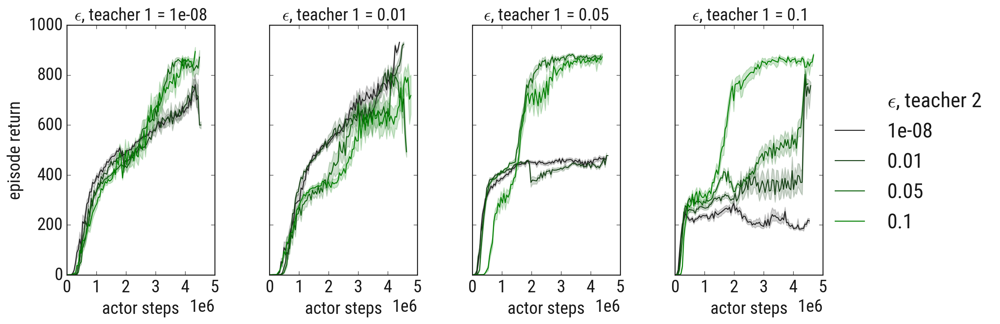

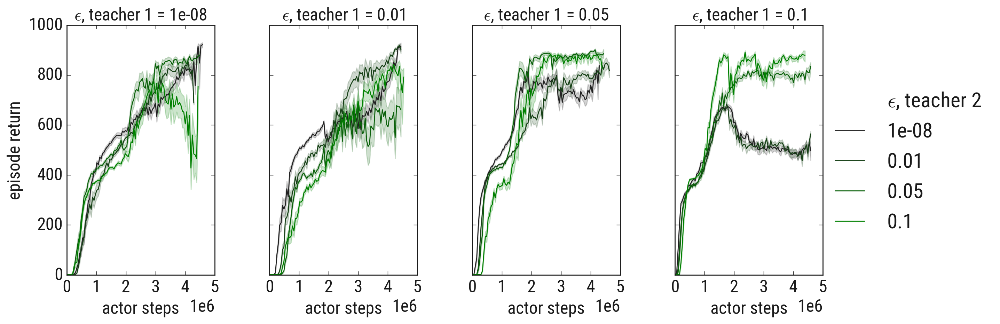

In [114]:
set_plt_white(font_size=18)
plt.rcParams["figure.figsize"] = [25.6, 19.2]
sns.relplot(x="actor steps", y="episode return", data=df_evaluator[df_evaluator['walk margin'] == 0.0], 
            kind="line",
            col=r'$\epsilon$, teacher 1',
            hue=r'$\epsilon$, teacher 2', 
            legend="full", 
            palette=sns.dark_palette("green", n_colors=4),
            aspect=1/1.618)
plt.ylim(0, 1000)
plt.xlim(0, 5e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_humanoid_bothteachers_14823367_walk_margin0_white')

sns.relplot(x="actor steps", y="episode return", data=df_evaluator[df_evaluator['walk margin'] == 1.0], 
            kind="line",
            col=r'$\epsilon$, teacher 1',
            hue=r'$\epsilon$, teacher 2', 
            legend="full", 
            palette=sns.dark_palette("green", n_colors=4),
            aspect=1/1.618)
plt.ylim(0, 1000)
plt.xlim(0, 5e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_humanoid_bothteachers_14823367_walk_margin1_white')

# Calibration: check eps=1e-8 vs eps=0

In [ ]:
#@title Load dataframes
df_name_evaluator = 'evaluator'
xid = 13952655
xid_approx_nice = 13870357
xid_approx = 13685214
samples_per_insert=128
eps_small=1e-8
# No teacher 
experiment_xid = xid
hyper = read_hyper(experiment_xid)

df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_evaluator = df_evaluator[df_evaluator['agent.samples_per_insert'] == samples_per_insert]

# Teacher eps = 1e-8
#@title Load dataframes
experiment_xid = xid_approx_nice
hyper = read_hyper(experiment_xid)

df_approx_nice = load_data(experiment_xid, df_name_evaluator)
df_approx_nice = merge_data_with_hyper(df_approx_nice,hyper)

#@title Drop columns
df_approx_nice = df_approx_nice.drop(['XManager/monotonic_timestamp',
                                      'RId',
                                      'episode_length',
                                      'learner_steps',
                                      'learner_walltime',
                                      'steps_per_second',
                                      'timestamp',
                                      'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_approx_nice = df_approx_nice[df_approx_nice['agent.samples_per_insert'] == samples_per_insert]
df_approx_nice = df_approx_nice[df_approx_nice['mpo.teacher1_epsilon_penalty'] == eps_small]
df_approx_nice = df_approx_nice[df_approx_nice['mpo.teacher2_epsilon_penalty'] == eps_small]

df_approx_nice = df_approx_nice.drop([
                                  'mpo.teacher1_epsilon_penalty',
                                  'mpo.teacher2_epsilon_penalty'], axis=1)


# Teacher eps = 1e-8
#@title Load dataframes
experiment_xid = xid_approx
hyper = read_hyper(experiment_xid)

df_approx = load_data(experiment_xid, df_name_evaluator)
df_approx = merge_data_with_hyper(df_approx,hyper)

#@title Drop columns
df_approx = df_approx.drop(['XManager/monotonic_timestamp',
                            'RId',
                            'episode_length',
                            'learner_steps',
                            'learner_walltime',
                            'steps_per_second',
                            'timestamp',
                            'environment.domain_name'], axis=1)

#@title Choose dataframe with finite task penalty
df_approx = df_approx[df_approx['agent.samples_per_insert'] == samples_per_insert]
df_approx = df_approx[df_approx['mpo.epsilon'] == 0.1]
df_approx = df_approx[df_approx['mpo.teacher1_epsilon_penalty'] == eps_small]
df_approx = df_approx[df_approx['mpo.teacher2_epsilon_penalty'] == eps_small]

df_approx = df_approx.drop(['mpo.teacher1_epsilon_penalty',
                            'mpo.teacher2_epsilon_penalty'], axis=1)

In [ ]:
df_evaluator = pd.concat([df_evaluator.assign(dataset='df_evaluator'), 
                          df_approx_nice.assign(dataset='df_approx_nice'),
                          df_approx.assign(dataset='df_approx')])
df_evaluator = df_evaluator.rename(columns={"environment.task_name": "task",
                                            "mpo.epsilon": "epsilon"})

/export/hda3/borglet/remote_hdd_fs_dirs/0.colab_kernel_deepmind_gpu_py3_shrutimishra.kernel.shrutimishra.508487142843.14b334fb3717c109/mount/server/dm_notebook3.par:3: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 2000
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

3000.0 60250000.0


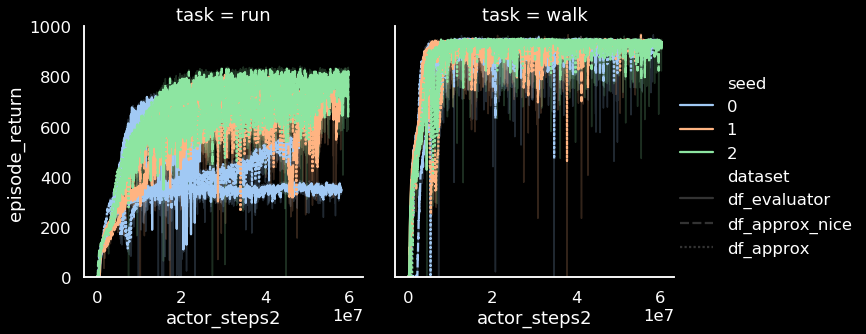

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator.iloc[::1, :], 
            col="task",
            kind="line",
            hue="seed",
            style="dataset",
            legend="full", 
            palette=sns.color_palette("pastel", 3))
plt.ylim(0, 1000)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

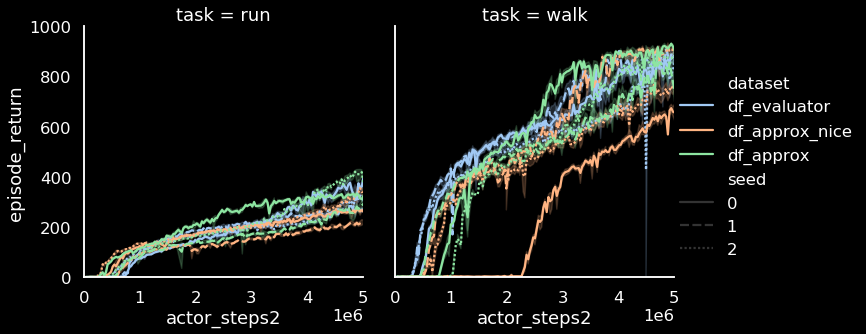

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator.iloc[::1, :], 
            col="task",
            kind="line",
            style="seed",
            hue="dataset", 
            legend="full", 
            palette=sns.color_palette("pastel", 3))
plt.ylim(0, 1000)
plt.xlim(0, 5e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

# 20200604 Scheduling teachers 1,2

In [ ]:
#@title Load dataframes
df_name_evaluator = 'evaluator'
xid_a = 13989028
xid_b = 14015712

experiment_xid = xid_a

hyper = read_hyper(experiment_xid)
df_a = load_data(experiment_xid, df_name_evaluator)
df_a = merge_data_with_hyper(df_a,hyper)

experiment_xid = xid_b

hyper = read_hyper(experiment_xid)
df_b = load_data(experiment_xid, df_name_evaluator)
df_b = merge_data_with_hyper(df_b,hyper)

df_concat = pd.concat([df_a.assign(dataset='df_a'), 
                       df_b.assign(dataset='df_b')])

df_concat = df_concat[df_concat['mpo.epsilon'] == 0.1]

#@title Drop columns
df_concat = df_concat.drop(['XManager/monotonic_timestamp',
                            'RId',
                            'episode_length',
                            'learner_steps',
                            'learner_walltime',
                            'steps_per_second',
                            'timestamp',
                            'environment.domain_name',
                            'agent.samples_per_insert',
                            'mpo.epsilon',
                            'mpo.teacher1_epsilon_penalty'], axis=1)

In [ ]:
#@title Choose subset of experiments: walk, teacher2_on==0
df_concat_walk = df_concat[df_concat['environment.task_name'] == 'walk']
df_concat_walk = df_concat[df_concat['mpo.teacher2_on'] == 0]

df_concat_walk.drop(df_concat_walk[df_concat_walk['mpo.teacher2_off'] == 100000].index, inplace=True)
df_concat_walk.drop(df_concat_walk[df_concat_walk['mpo.teacher2_off'] == 200000].index, inplace=True)
df_concat_walk.drop(df_concat_walk[df_concat_walk['mpo.teacher2_off'] == 5000000].index, inplace=True)


In [ ]:
#@title Bin the actor steps and append to dataframe
df = df_concat_walk
min_actor_step = np.amin(df['actor_steps'])
max_actor_step = np.amax(df['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 400
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df['actor_steps']).reshape(-1,1) - steps), axis=1)]

df_concat_walk['actor_steps2'] = actor_steps2

1000.0 23739000.0


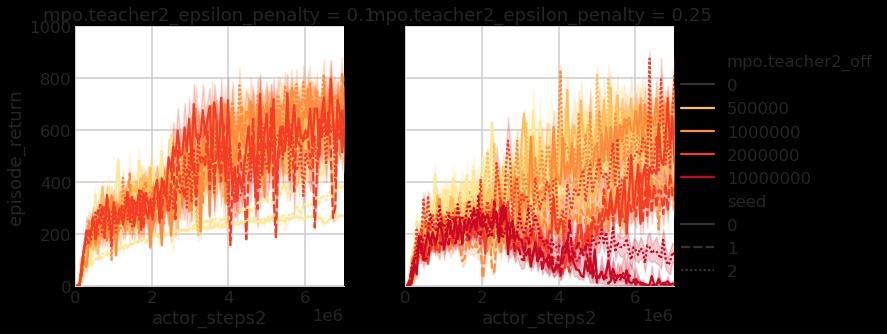

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_concat_walk.iloc[::1, :], 
            col="mpo.teacher2_epsilon_penalty",
            kind="line",
            style="seed",
            hue="mpo.teacher2_off", 
            legend="full", 
            palette=sns.color_palette("YlOrRd", 5)
            )
plt.ylim(0, 1000)
plt.xlim(0, 7e6)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

In [ ]:
sns.set(context='talk',style='white')
plt.style.available
plt.style.use("seaborn-whitegrid")

## Scheduling 2 teachers

In [ ]:
#@title Load dataframes
experiment_xid = 14068097
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name',
                                  'agent.samples_per_insert'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher1_epsilon_penalty", 
                                            "mpo.teacher2_epsilon_penalty": "teacher2_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 100
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

1000.0 44286000.0


In [ ]:
df_evaluator.head()

,WId,actor_episodes,actor_steps,episode_return,evaluator_episodes,evaluator_steps,teacher2_epsilon_penalty,seed,teacher1_epsilon_penalty,mpo.teacher2_off,mpo.teacher2_on,mpo.teacher1_off,epsilon,actor_steps2
0,1,4.0,4000.0,1.517981,1,1000,0.1,0,0.1,0,0,100000,0.1,1000.0
1,1,5.0,5000.0,1.571861,5,5000,0.1,0,0.1,0,0,100000,0.1,1000.0
2,1,9.0,9000.0,1.790017,11,11000,0.1,0,0.1,0,0,100000,0.1,1000.0
3,1,12.0,12000.0,0.313831,17,17000,0.1,0,0.1,0,0,100000,0.1,1000.0
4,1,13.0,13000.0,0.816325,23,23000,0.1,0,0.1,0,0,100000,0.1,1000.0


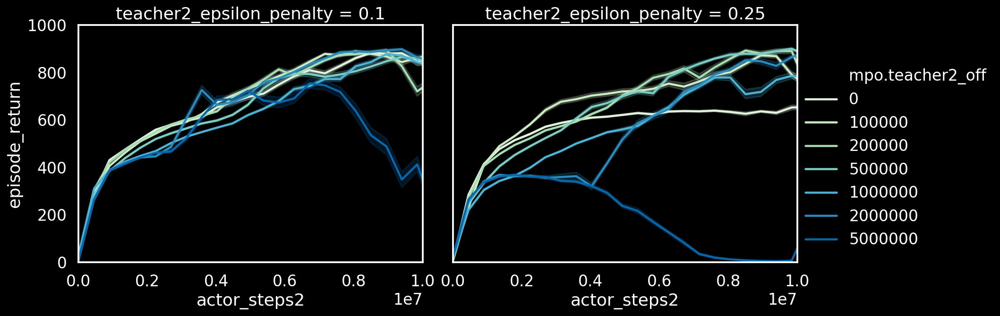

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            col="teacher2_epsilon_penalty",
            hue="mpo.teacher2_off", 
            legend="full", 
            palette=sns.color_palette("GnBu", 7),
            aspect=1.218)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))


# Selecting teachers based on observation
## XId: 14152270

In [ ]:
#@title Load dataframes
experiment_xid = 14152270
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name',
                                  'agent.samples_per_insert'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 100
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

2000 15631000


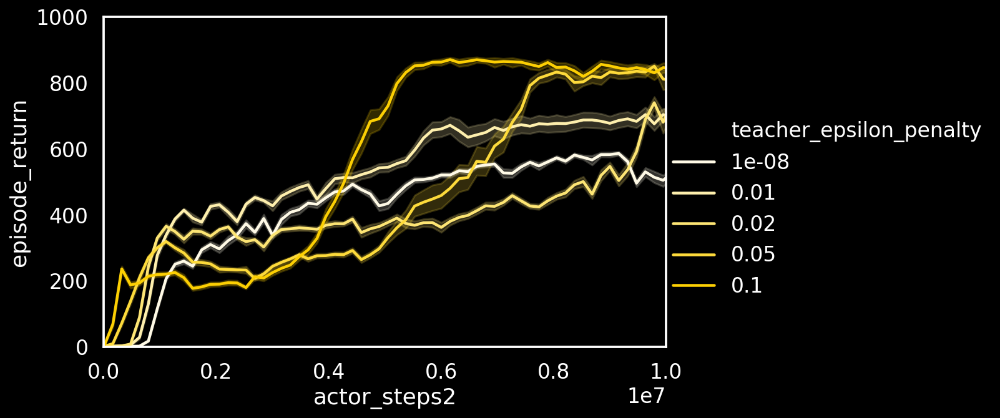

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            hue="teacher_epsilon_penalty", 
            legend="full", 
            palette=sns.light_palette((252/255, 207/255, 3/255), n_colors=5),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))


# Selecting teachers based on observation -- rerun 
> XId: 14821017

In [82]:
#@title Load dataframes
experiment_xid = 14821017
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name',
                                  'agent.samples_per_insert'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": r"$\epsilon$, teacher", 
                                            "mpo.epsilon": "epsilon",
                                            "episode_return": "episode return",
                                            "environment.walk_margin": "walk margin"})

In [67]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 40
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 2853000.0


'https://drive.google.com/file/d/1YM9_0KbuP_iXeP-iQZAUPiOxdGQG86t8/view'

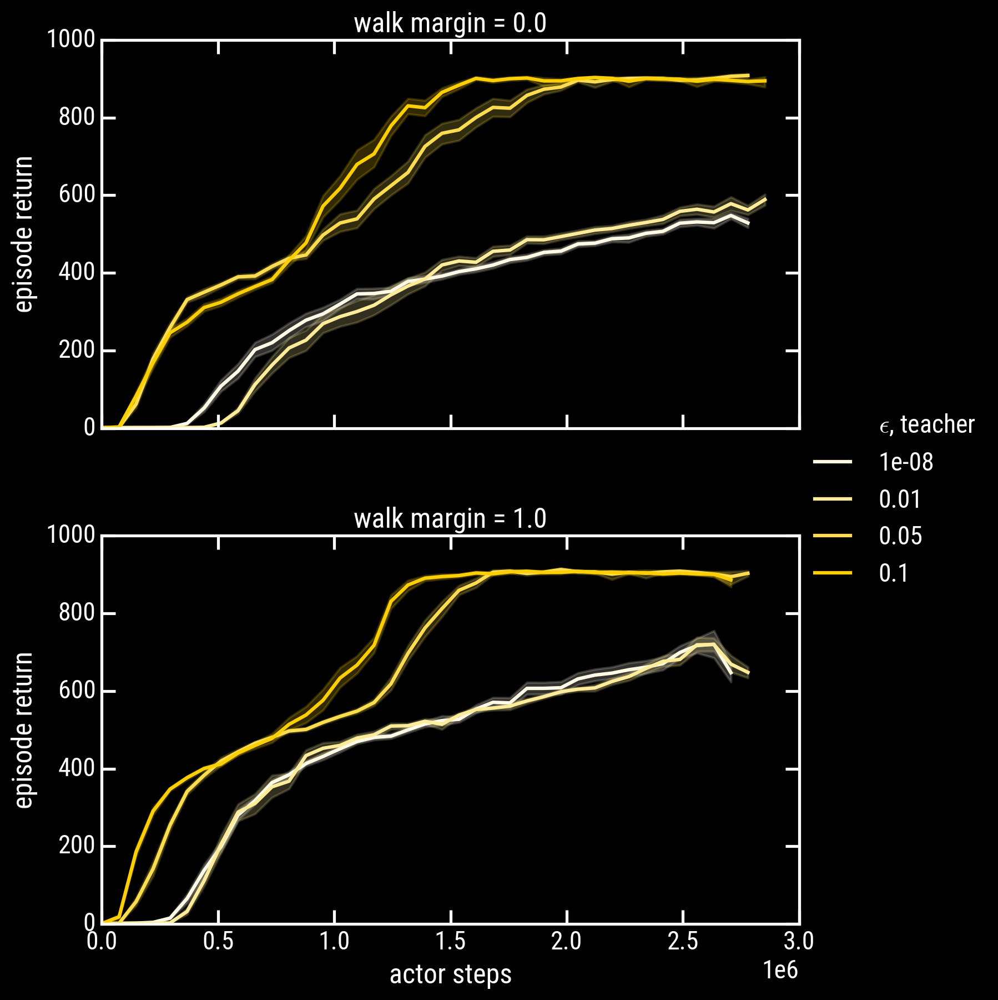

In [68]:
sns.set_context('talk')
set_plt_black()
plt.rcParams["figure.figsize"] = [30,5]
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            hue=r"$\epsilon$, teacher", 
            row="walk margin",
            legend="full", 
            palette=sns.light_palette((252/255, 207/255, 3/255), n_colors=4),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 3e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_teachermix_14821017_2')

'https://drive.google.com/file/d/1cGFhOWMlRMMmpavadekGsAb0EpGhRAGL/view'

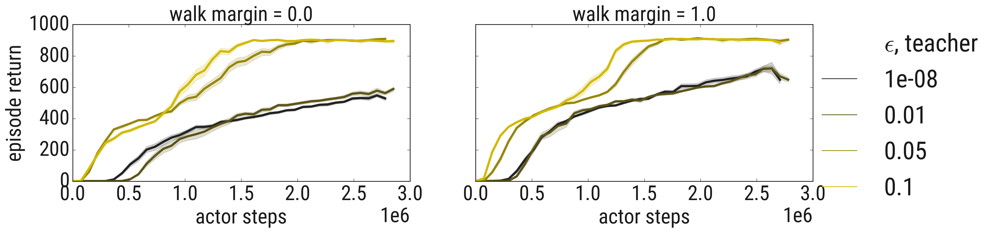

In [81]:
sns.set_context('talk')
set_plt_white(28)
plt.rcParams["figure.figsize"] = [60,10]
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line", linewidth=3,
            hue=r"$\epsilon$, teacher", 
            col="walk margin",
            legend="full", 
            palette=sns.dark_palette((209/255, 185/255, 0/255), n_colors=4),
            aspect=1.618,
            )
plt.ylim(0, 1000)
plt.xlim(0, 3e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_teachermix_14821017_white')

# Selecting teachers with equal probability 
## XId: 14196851

In [ ]:
#@title Load dataframes
experiment_xid = 14196851
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name',
                                  'agent.samples_per_insert'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"mpo.teacher1_epsilon_penalty": "teacher_epsilon_penalty", 
                                            "mpo.epsilon": "epsilon",
                                            "environment.stand_margin": "stand_margin",
                                            "environment.walk_margin": "walk_margin"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 100
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor_steps2'] = actor_steps2

1000.0 16275000.0


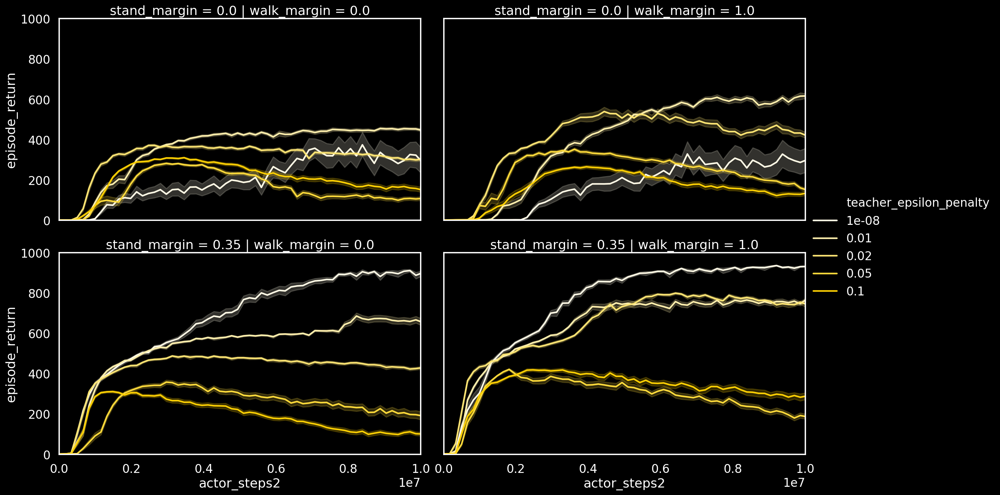

In [ ]:
sns.relplot(x="actor_steps2", y="episode_return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            hue="teacher_epsilon_penalty", 
            row='stand_margin',
            col='walk_margin',
            legend="full", 
            palette=sns.light_palette((252/255, 207/255, 3/255), n_colors=5),
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 10e6)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))


# Composition on point_mass tasks

In [ ]:
#@title Load dataframes -- 14296496
experiment_xid = 14296496
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"episode_return": "episode return",
                                            "mpo.teacher1_epsilon_penalty": r'teacher 1 $\epsilon$', 
                                            "mpo.teacher2_epsilon_penalty": r'teacher 2 $\epsilon$', 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 25
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 260000.0


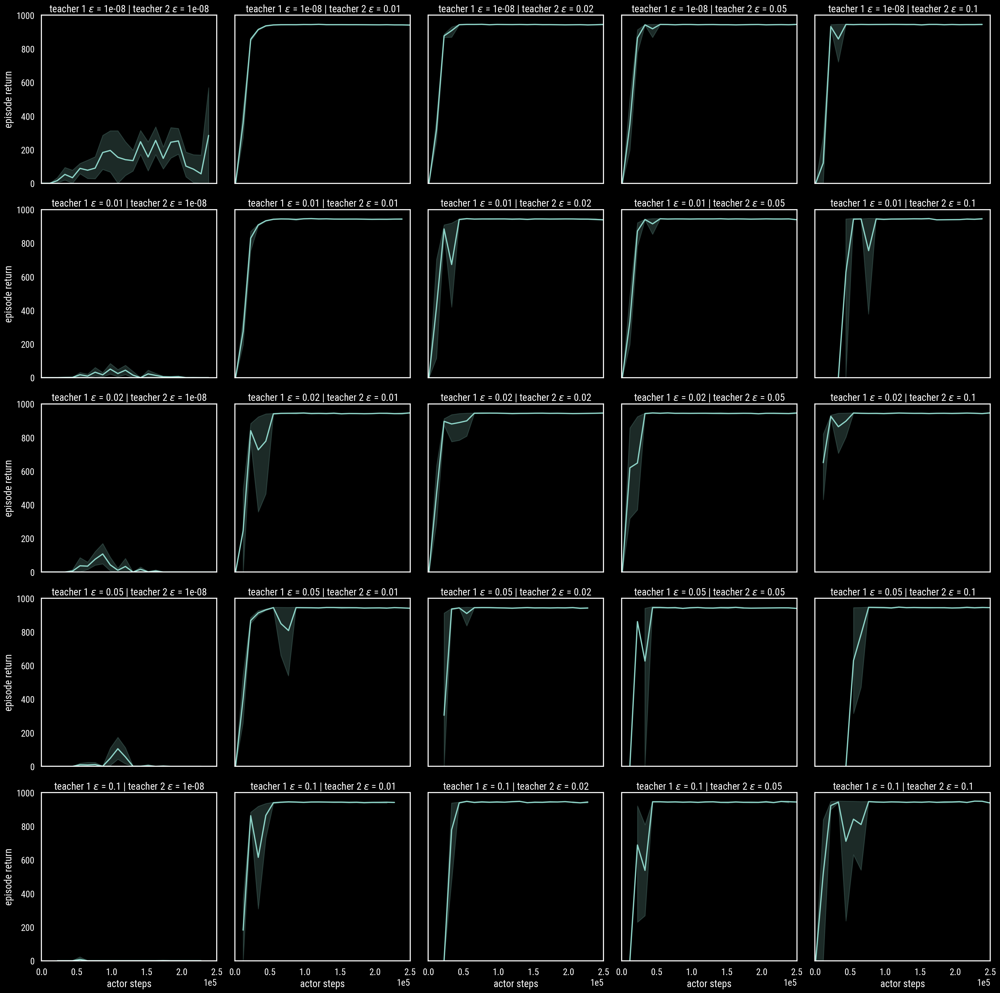

In [ ]:
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            row=r'teacher 1 $\epsilon$',
            col=r'teacher 2 $\epsilon$',
            legend="full")
plt.ylim(0, 1000)
plt.xlim(0, 250000)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))

In [ ]:
#@title Load dataframes -- 14361814
experiment_xid = 14361814
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"episode_return": "episode return",
                                            "mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher 1', 
                                            "mpo.teacher2_epsilon_penalty": r'$\epsilon$, teacher 2', 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 25
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 506000.0


'https://drive.google.com/file/d/1w6oOpzDcNC3l54aejNtN9xTIQAK0aPKm/view'

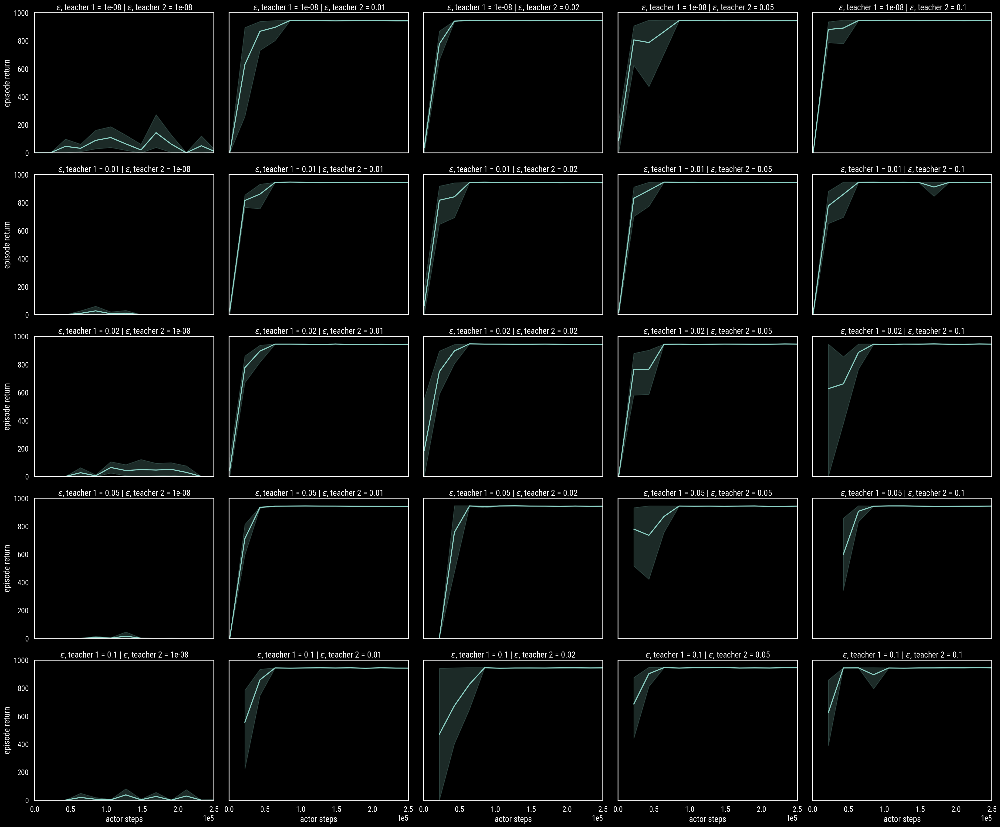

In [ ]:
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            row=r'$\epsilon$, teacher 1',
            col=r'$\epsilon$, teacher 2',
            legend="full",
            aspect=1.2)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('name')

In [ ]:
#@title Load dataframes -- 14477657
experiment_xid = 14477657
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"episode_return": "episode return",
                                            "mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher 1', 
                                            "mpo.teacher2_epsilon_penalty": r'$\epsilon$, teacher 2', 
                                            "mpo.epsilon": "epsilon"})

In [ ]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 25
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 455000.0


'https://drive.google.com/file/d/1rrzDz2BRS6t_q7CWh7OQIdEfU6ZSYDJk/view'

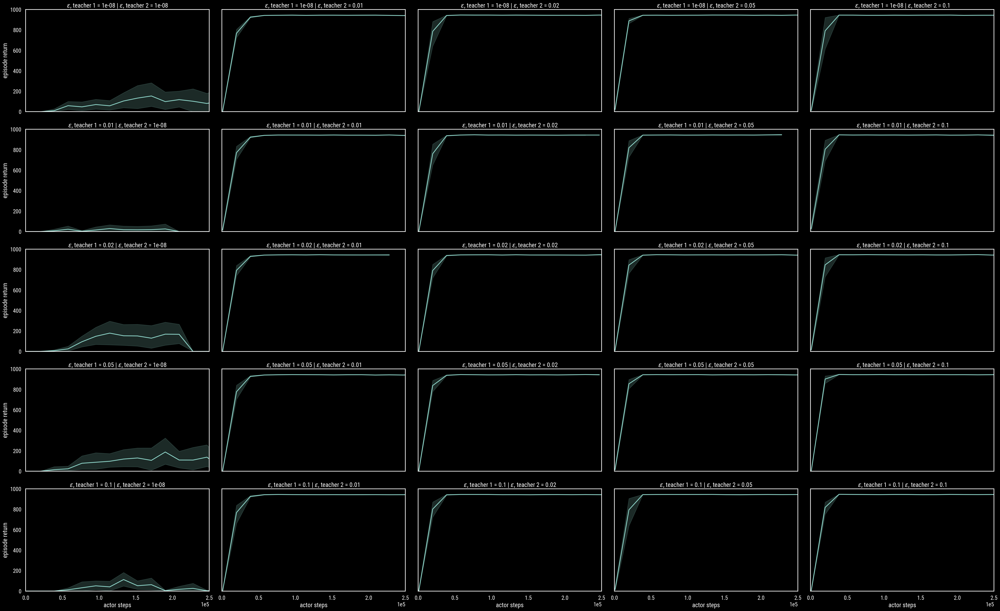

In [ ]:
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line",
            row=r'$\epsilon$, teacher 1',
            col=r'$\epsilon$, teacher 2',
            legend="full",
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
plt.rcParams.update({'font.size': 100})
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('tmp')

## Load composed policies
> XId = 14732181, 14771937 

In [92]:
#@title Load dataframes -- 14732181
experiment_xid = 14732181
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"episode_return": "episode return",
                                            "mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher 1', 
                                            "mpo.teacher2_epsilon_penalty": r'$\epsilon$, teacher 2', 
                                            "mpo.epsilon": "epsilon"})

In [97]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 50
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 1001000.0


In [ ]:
df_evaluator = df_evaluator[df_evaluator['epsilon'] == 1e-8]

'https://drive.google.com/file/d/1y-SHtDqMfmvQCjB2JettleiBXUOohToi/view'

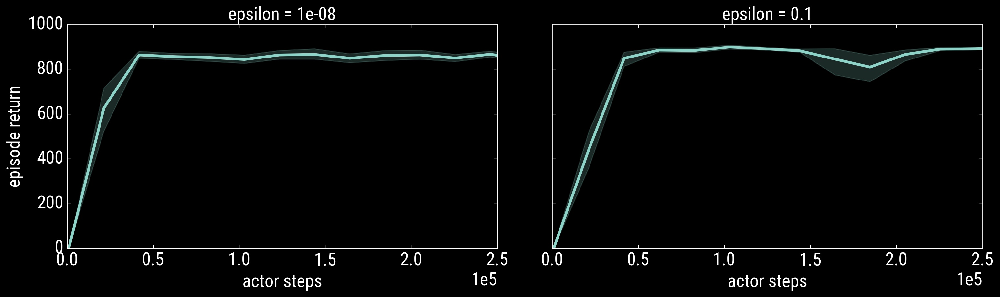

In [98]:
set_plt_black(20)
plt.rcParams["figure.figsize"] = [30,5]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line", linewidth=3,
            col='epsilon', legend='full',
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
plt.rcParams.update({'font.size': 100})
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_pointmass_composed_return_14732181')

'https://drive.google.com/file/d/1SIWvW68RxQJgmFdchnL82kqWCY37WAyZ/view'

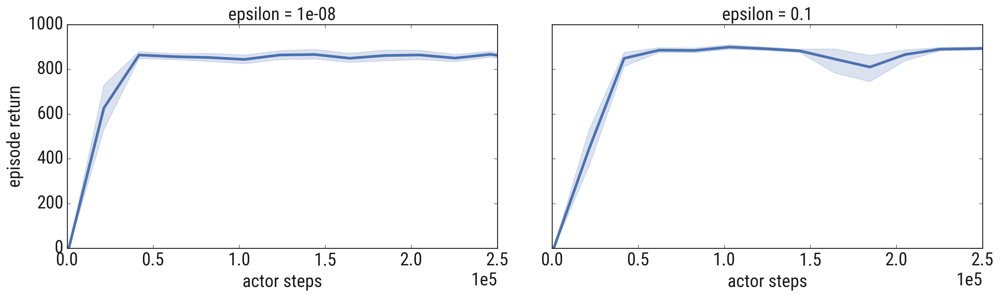

In [99]:
set_plt_white(20)
plt.rcParams["figure.figsize"] = [30,5]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line", linewidth=3,
            col='epsilon', legend='full',
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
plt.rcParams.update({'font.size': 100})
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('20200703_pointmass_composed_return_14732181_white')

In [101]:
#@title Load dataframes -- 14771937
experiment_xid = 14771937
hyper = read_hyper(experiment_xid)

df_name_evaluator = 'evaluator'
df_evaluator = load_data(experiment_xid, df_name_evaluator)
df_evaluator = merge_data_with_hyper(df_evaluator,hyper)

#@title Drop columns
df_evaluator = df_evaluator.drop(['XId',
                                  'XManager/monotonic_timestamp',
                                  'RId',
                                  'episode_length',
                                  'learner_steps',
                                  'learner_walltime',
                                  'steps_per_second',
                                  'timestamp',
                                  'environment.domain_name',
                                  'environment.task_name'], axis=1)

#@title Choose dataframe with finite task penalty

df_evaluator = df_evaluator.rename(columns={"episode_return": "episode return",
                                            "mpo.teacher1_epsilon_penalty": r'$\epsilon$, teacher 1', 
                                            "mpo.teacher2_epsilon_penalty": r'$\epsilon$, teacher 2', 
                                            "mpo.epsilon": "epsilon"})

In [102]:
#@title Bin the actor steps and append to dataframe
min_actor_step = np.amin(df_evaluator['actor_steps'])
max_actor_step = np.amax(df_evaluator['actor_steps'])
print(min_actor_step, max_actor_step)
# Divide in to N different bins
n_bins = 25
steps = np.linspace(min_actor_step, max_actor_step, n_bins)
actor_steps2 = steps[np.argmin(np.abs(np.array(df_evaluator['actor_steps']).reshape(-1,1) - steps), axis=1)]
df_evaluator['actor steps'] = actor_steps2

1000.0 1002000.0


'https://drive.google.com/file/d/1fblZONKySmCdWAaVfVakg4rRmvpZx1PX/view'

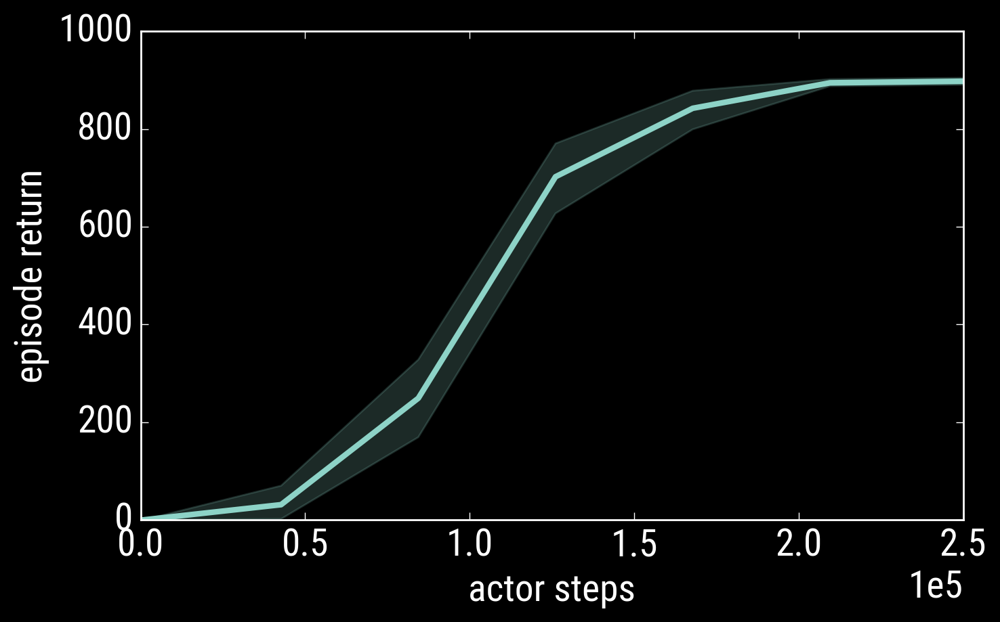

In [90]:
set_plt_black(20)
plt.rcParams["figure.figsize"] = [30,5]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line", linewidth=3,
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
plt.rcParams.update({'font.size': 100})
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_pointmass_no_teacher_14771937')

'https://drive.google.com/file/d/1TxXHgI0o5qPdJTlGH3BB4BqLA5oE27WN/view'

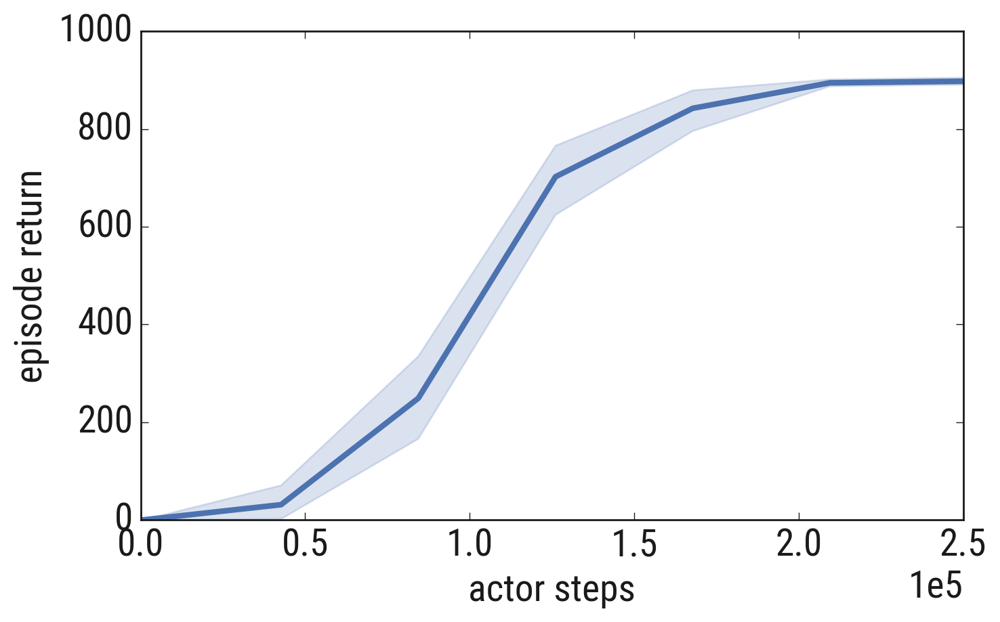

In [103]:
set_plt_white(20)
plt.rcParams["figure.figsize"] = [30,5]
plt.rcParams["figure.dpi"] = 300.
sns.relplot(x="actor steps", y="episode return", data=df_evaluator.iloc[::1, :], 
            kind="line", linewidth=3,
            aspect=1.618)
plt.ylim(0, 1000)
plt.xlim(0, 250000)
plt.rcParams.update({'font.size': 100})
sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
plt.ticklabel_format(axis='x', style="sci", scilimits=(0,0))
save_plot_to_drive('20200702_pointmass_no_teacher_14771937_white')

In [ ]:
df_evaluator = pd.concat([df_evaluator.assign(teacher='on'), 
                          df_approx_nice.assign(teacher='off')])